Rendering animation... (This may take a moment)
Saved as 'dtw_comparison.gif'


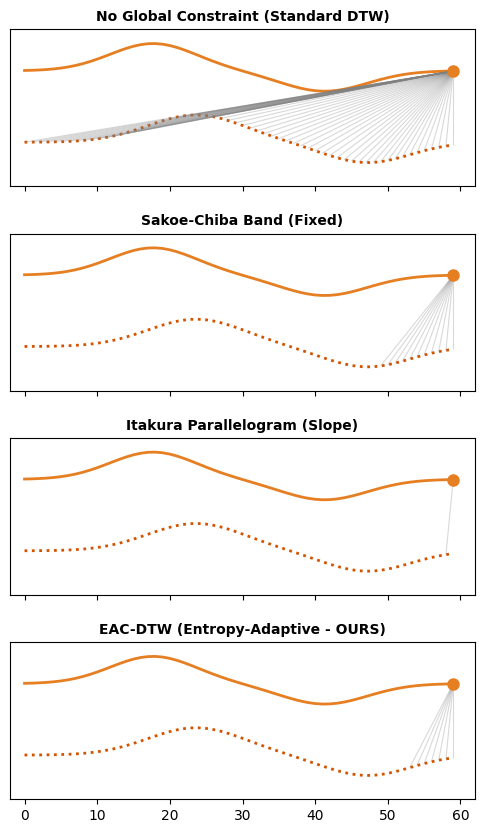

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.collections import LineCollection
from scipy.stats import entropy

# ==========================================
# 1. HELPER FUNCTIONS (MATH & SIGNAL)
# ==========================================

def generate_signals(n=100):
    """Generates a 'Hill and Valley' signal similar to the video."""
    t = np.linspace(0, 100, n)
    # Signal 1 (Query): A bump then a dip
    sig1 = 2.0 * np.exp(-(t - 30)**2 / 200) - 1.5 * np.exp(-(t - 70)**2 / 200)
    # Signal 2 (Reference): Same but shifted and slightly distorted
    sig2 = 2.0 * np.exp(-(t - 40)**2 / 250) - 1.5 * np.exp(-(t - 80)**2 / 200)
    
    # Normalize to 0-1 range for cleaner plotting
    sig1 = (sig1 - sig1.min()) / (sig1.max() - sig1.min())
    sig2 = (sig2 - sig2.min()) / (sig2.max() - sig2.min())
    return sig1, sig2

def calculate_local_entropy(signal, window=10):
    """Your Rolling Entropy Function."""
    n = len(signal)
    ent = np.zeros(n)
    pad = np.pad(signal, window//2, mode='edge')
    for i in range(n):
        segment = pad[i:i+window]
        hist, _ = np.histogram(segment, bins=10, density=True)
        ent[i] = entropy(hist + 1e-10)
    return ent

def get_eac_constraints(signal, w_min=2, w_max=30):
    """Your Logic: Map Entropy to Window Size."""
    ent = calculate_local_entropy(signal)
    # Sigmoid Mapping
    mu = np.mean(ent)
    k = 2.0 # Steepness
    sigmoid = 1 / (1 + np.exp(-k * (ent - mu)))
    windows = w_min + (w_max - w_min) * sigmoid
    return windows.astype(int)

# ==========================================
# 2. CONSTRAINT GENERATORS
# ==========================================

def get_valid_indices_no_constraint(i, n):
    """Standard DTW: All points are valid."""
    return np.arange(n)

def get_valid_indices_sakoe_chiba(i, n, radius=15):
    """Fixed Band."""
    start = max(0, i - radius)
    end = min(n, i + radius)
    return np.arange(start, end)

def get_valid_indices_itakura(i, n):
    """Parallelogram Constraint."""
    # Approximate slopes: 0.5 and 2.0
    start = int(max(0, (i - 1) * 0.5, n - 2 * (n - i)))
    end = int(min(n, (i - 1) * 2 + 1, n - 0.5 * (n - i)))
    if start >= end: start = end - 1 # Safety
    return np.arange(start, end)

def get_valid_indices_eac(i, n, eac_windows):
    """Your Method: Adaptive Window."""
    w = eac_windows[i]
    start = max(0, i - w)
    end = min(n, i + w)
    return np.arange(start, end)

# ==========================================
# 3. ANIMATION SETUP
# ==========================================

# Setup Data
N = 60
s1, s2 = generate_signals(N)
eac_windows = get_eac_constraints(s1, w_min=2, w_max=25)

# Setup Plot
fig, axes = plt.subplots(4, 1, figsize=(6, 10), sharex=True)
plt.subplots_adjust(hspace=0.3)

titles = [
    "No Global Constraint (Standard DTW)",
    "Sakoe-Chiba Band (Fixed)",
    "Itakura Parallelogram (Slope)",
    "EAC-DTW (Entropy-Adaptive - OURS)"
]

# Styling constants
COLOR_Q = '#E67E22'  # Orange (Top)
COLOR_R = '#D35400'  # Darker Orange (Bottom)
COLOR_CONN = 'gray'
OFFSET = 1.5         # Vertical separation between signals

# Initialize artists list
scatters = []
lines_collections = []

for ax, title in zip(axes, titles):
    # Plot static signals
    ax.plot(s1 + OFFSET, color=COLOR_Q, lw=2)  # Top Signal
    ax.plot(s2, color=COLOR_R, ls=':', lw=2)   # Bottom Signal
    
    # Axis styling
    ax.set_title(title, fontsize=10, fontweight='bold')
    ax.set_yticks([])
    ax.set_xlim(-2, N+2)
    ax.set_ylim(-0.5, 2.8)
    
    # Initialize dynamic elements (Dot + Lines)
    scatter, = ax.plot([], [], 'o', color=COLOR_Q, markersize=8, zorder=5)
    lc = LineCollection([], colors=COLOR_CONN, alpha=0.3, linewidths=0.8)
    ax.add_collection(lc)
    
    scatters.append(scatter)
    lines_collections.append(lc)

# ==========================================
# 4. UPDATE FUNCTION
# ==========================================

def update(frame):
    i = frame
    
    # 1. No Constraint
    indices_nc = get_valid_indices_no_constraint(i, N)
    
    # 2. Sakoe-Chiba
    indices_sc = get_valid_indices_sakoe_chiba(i, N, radius=10)
    
    # 3. Itakura
    indices_it = get_valid_indices_itakura(i, N)
    
    # 4. EAC-DTW
    indices_eac = get_valid_indices_eac(i, N, eac_windows)
    
    indices_list = [indices_nc, indices_sc, indices_it, indices_eac]
    
    # Loop through subplots and update
    for ax_idx, valid_indices in enumerate(indices_list):
        # Update Dot Position on Top Signal
        current_y = s1[i] + OFFSET
        scatters[ax_idx].set_data([i], [current_y])
        
        # Create Lines segments
        # From (i, s1[i]+offset) -> (j, s2[j])
        segments = []
        for j in valid_indices:
            segments.append([(i, current_y), (j, s2[j])])
            
        lines_collections[ax_idx].set_segments(segments)
        
    return scatters + lines_collections

# ==========================================
# 5. RUN & SAVE
# ==========================================

ani = animation.FuncAnimation(fig, update, frames=range(N), interval=50, blit=True)

print("Rendering animation... (This may take a moment)")
# Save as GIF (requires ImageMagick or Pillow)
ani.save('dtw_comparison.gif', writer='pillow', fps=20)
print("Saved as 'dtw_comparison.gif'")

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.collections import LineCollection
from scipy.stats import entropy
from IPython.display import HTML  # <--- THIS IS THE KEY IMPORT

# ==========================================
# 1. SETUP DATA & FUNCTIONS
# ==========================================

def generate_signals(n=100):
    t = np.linspace(0, 100, n)
    # Signal 1 (Query)
    sig1 = 2.0 * np.exp(-(t - 30)**2 / 200) - 1.5 * np.exp(-(t - 70)**2 / 200)
    # Signal 2 (Reference) - Shifted
    sig2 = 2.0 * np.exp(-(t - 40)**2 / 250) - 1.5 * np.exp(-(t - 80)**2 / 200)
    
    # Normalize
    sig1 = (sig1 - sig1.min()) / (sig1.max() - sig1.min())
    sig2 = (sig2 - sig2.min()) / (sig2.max() - sig2.min())
    return sig1, sig2

def get_eac_constraints(signal, w_min=2, w_max=30):
    """Entropy Logic"""
    n = len(signal)
    ent = np.zeros(n)
    # Simple Entropy calc
    pad = np.pad(signal, 5, mode='edge')
    for i in range(n):
        segment = pad[i:i+10]
        hist, _ = np.histogram(segment, bins=10, density=True)
        # Avoid log(0)
        ent[i] = entropy(hist + 1e-10)
    
    # Sigmoid Mapping
    mu = np.mean(ent)
    k = 2.0 
    sigmoid = 1 / (1 + np.exp(-k * (ent - mu)))
    windows = w_min + (w_max - w_min) * sigmoid
    return windows.astype(int)

# ==========================================
# 2. DEFINE CONSTRAINT TYPES
# ==========================================

def get_indices_nc(i, n): return np.arange(n) # No Constraint

def get_indices_sc(i, n, r=10): # Sakoe-Chiba
    return np.arange(max(0, i-r), min(n, i+r))

def get_indices_it(i, n): # Itakura
    # Standard Itakura Parallelogram slopes (approximate)
    lower = max(0, 2*i - n, (i-1)/2)
    upper = min(n, 2*i + 1, (i+n)/2) # Loosened slightly for visual
    return np.arange(int(lower), int(upper))

def get_indices_eac(i, n, wins): # EAC-DTW
    w = wins[i]
    return np.arange(max(0, i-w), min(n, i+w))

# ==========================================
# 3. BUILD THE PLOT
# ==========================================

N = 60 # Number of frames (points)
s1, s2 = generate_signals(N)
eac_wins = get_eac_constraints(s1)

fig, axes = plt.subplots(4, 1, figsize=(7, 12), sharex=True)
plt.subplots_adjust(hspace=0.4)

titles = ["Standard DTW (Full Search)", "Sakoe-Chiba (Fixed)", 
          "Itakura (Fixed Slope)", "EAC-DTW (Adaptive - OURS)"]
funcs = [get_indices_nc, get_indices_sc, get_indices_it, get_indices_eac]

# Store plot objects
dots = []
lines = []

OFFSET = 1.5

for ax, title in zip(axes, titles):
    # Static Background
    ax.plot(s1 + OFFSET, color='#E67E22', lw=2)
    ax.plot(s2, color='#D35400', ls=':', lw=2)
    ax.set_title(title, fontweight='bold', fontsize=10)
    ax.set_yticks([])
    ax.set_ylim(-0.5, 3.0)
    
    # Dynamic Objects
    dot, = ax.plot([], [], 'o', color='#E67E22', ms=8, zorder=5)
    lc = LineCollection([], colors='gray', alpha=0.3, lw=1)
    ax.add_collection(lc)
    dots.append(dot)
    lines.append(lc)

# ==========================================
# 4. ANIMATION LOOP
# ==========================================

def update(frame):
    for j, func in enumerate(funcs):
        # 1. Get valid indices for this method
        if j == 3: # EAC needs extra arg
            indices = func(frame, N, eac_wins)
        else:
            indices = func(frame, N)
            
        # 2. Move the Dot
        y_pos = s1[frame] + OFFSET
        dots[j].set_data([frame], [y_pos])
        
        # 3. Draw the gray scan lines
        segs = [[(frame, y_pos), (idx, s2[idx])] for idx in indices]
        lines[j].set_segments(segs)
        
    return dots + lines

ani = animation.FuncAnimation(fig, update, frames=range(0, N, 1), 
                              interval=100, blit=True)

# ==========================================
# 5. DISPLAY AS VIDEO (The Fix!)
# ==========================================
plt.close() # Prevents the static image from showing up twice
HTML(ani.to_jshtml())

In [5]:
# ani.save('eac_dtw_demo.mp4', fps=15)

In [4]:
ani.save('eac_dtw_demo.gif', writer='pillow', fps=15)